<a href="https://colab.research.google.com/github/lenos16/CAS-ADS-Projects/blob/main/M6%20Project/M6%20Project%20v1.0%20colab%20final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Importing Libraries
import tensorflow 
import numpy as np 
import pandas as pd 
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
from music21 import lily
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import os
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)



## Loading the Data


In [2]:
!git clone https://github.com/lenos16/Mozart.git

Cloning into 'Mozart'...
remote: Enumerating objects: 77, done.
remote: Total 77 (delta 0), reused 0 (delta 0), pack-reused 77
Unpacking objects: 100% (77/77), done.


In [3]:
filepath= "/content/Mozart/Mozart/"
all_midis=[]
for i in os.listdir(filepath):
    if i.endswith('.mid'):
        tr = filepath+i
        midi = converter.parse(tr)
        all_midis.append(midi)

**Function to extract notes**

In [4]:
#Helping function        
def extract_notes(file):
    notes = []
    pick = None
    for j in file:
        songs = instrument.partitionByInstrument(j)
        for part in songs.parts:
            pick = part.recurse()
            for element in pick:
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                elif isinstance(element, chord.Chord):
                    notes.append(".".join(str(n) for n in element.normalOrder))

    return notes
#Getting the list of notes as Corpus
Corpus= extract_notes(all_midis)
print("Total notes in all the Mozart midis in the dataset:", len(Corpus))

Total notes in all the Mozart midis in the dataset: 223934


## Data Exploration ##

In [5]:
print("First fifty values in the Corpus:", Corpus[:50])

First fifty values in the Corpus: ['0', '4.7', 'D5', 'E5', 'F5', 'G5', 'A5', 'B5', '7.0', '4.7', '11.2', 'D4', 'G4', 'E5', 'F5', 'G5', 'A5', 'B5', 'C6', '2', 'G4', '0.4', '4.7', 'F5', 'G5', 'A5', 'B5', 'C6', 'D6', 'E4', 'E6', 'G4', 'G3', 'F6', '7.11', 'D4', 'E6', 'D6', 'C6', 'B5', 'A5', 'G5', 'F5', 'E5', 'D4', 'D5', '0', '4.7', 'D5', 'E5']


All the values above indicates notes

**Printing music sheet**

In [6]:
#lilypond is needed to show the music notes
print('installing lilypond...')
!apt-get install lilypond

installing lilypond...
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-lmodern fonts-noto-mono ghostscript gsfonts
  libauthen-sasl-perl libcupsfilters1 libcupsimage2 libdata-dump-perl
  libencode-locale-perl libfile-listing-perl libfont-afm-perl libgs9
  libgs9-common libhtml-form-perl libhtml-format-perl libhtml-parser-perl
  libhtml-tagset-perl libhtml-tree-perl libhttp-cookies-perl
  libhttp-daemon-perl libhttp-date-perl libhttp-message-perl
  libhttp-negotiate-perl libijs-0.35 libio-html-perl libio-socket-ssl-perl
  libjbig2dec0 libkpathsea6 liblwp-mediatypes-perl liblwp-protocol-https-perl
  libmailtools-perl libnet-http-perl libnet-smtp-ssl-perl libnet-ssleay-perl
  libpotrace0 libptexenc1 libsynctex1 libtexlua52 libtexluajit2
  libtext-unidecode-perl libtimedate-perl libtry-tiny-perl liburi-perl
  libwww-perl libwww-robotrules-perl libxml-libxml-perl

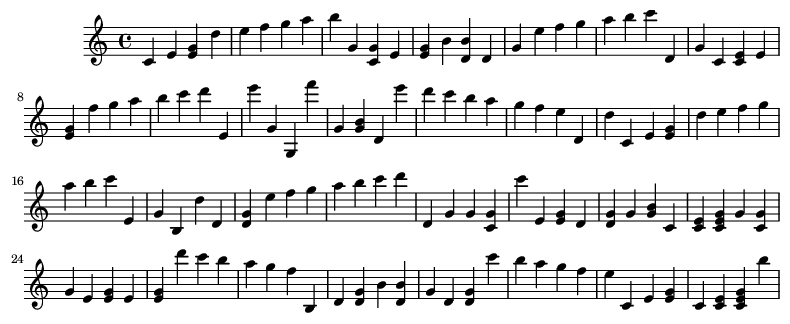

In [7]:
#First Lets write some functions that we need to look into the data
def show(music):
    display(Image(str(music.write("lily.png"))))
    
def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = [] 
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)            
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else: 
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)   
    return Melody_midi

Melody_Snippet = chords_n_notes(Corpus[:100])
show(Melody_Snippet)


In [8]:
#Creating a count dictionary
count_num = Counter(Corpus)
print("Total unique notes in the Corpus:", len(count_num))


Total unique notes in the Corpus: 498


In [9]:
#Exploring the notes dictionary
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
#Average recurrenc for a note in Corpus
def Average(lst):
    return sum(lst) / len(lst)
print("Average recurrence for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")


Average recurrence for a note in Corpus: 449.6666666666667
Most frequent note in Corpus appeared: 9212 times
Least frequent note in Corpus appeared: 1 time


Clearly, there are some very rare notes in the music pieces; some so rare that it was played only once in the whole data. This would create a lot of problems. To avoid errors and any potential outlier problems, let us have a look at the frequency of the notes. To handle the outlier problem we shall trim those.

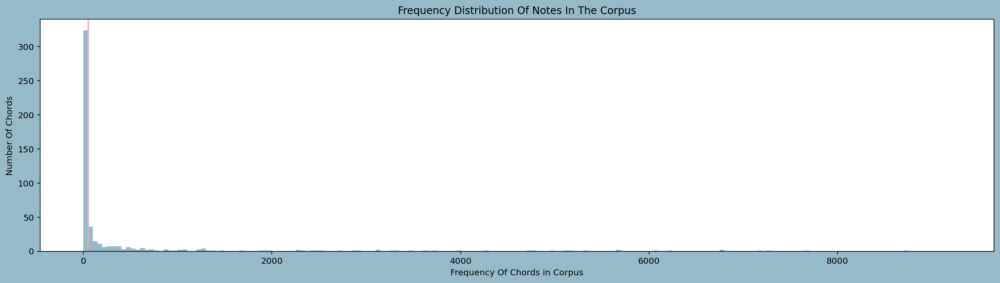

In [10]:
# Plotting the distribution of Notes
plt.figure(figsize=(20,5),facecolor="#97BACB")
bins = np.arange(0,(max(Recurrence)), 50) 
plt.hist(Recurrence, bins=bins, color="#97BACB")
plt.axvline(x=50,color="#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

In [11]:
#Getting a list of rare chords
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 50:
        m =  key
        rare_note.append(m)
        
print("Total number of notes that occur less than 50 times:", len(rare_note))


Total number of notes that occur less than 50 times: 324


In [12]:
#Eleminating the rare notes
for element in Corpus:
    if element in rare_note:
        Corpus.remove(element)

print("Length of Corpus after elemination the rare notes:", len(Corpus))

Length of Corpus after elemination the rare notes: 221741


## Data Preprocessing ##
Notes are basically sound waves. In music, specific combinations of Frequency and Wavelength are standardized as these notes. Our Corpus has the name of that note. As we parsed the data at the time of loading we took the help of the music21 library (developed at MIT specifically for analyzing music); The library fetches Frequency, Wavelength, $ duration etc. for each given notes.

**In this section, we will be preparing the data for the model:**

**Creating a dictionary:** Creating a dictionary to map the notes and their indices. We have the note's name as a string the Corpus. For the computer, these names are just a symbol. So we create a dictionary to map each unique note in our Corpus to a number. And vice versa to retrieve the values at the time of prediction. This will be used to encode and decode the information going in and out of the RNN.

**Encoding and Splitting the corpus.**: Encoding and splitting the corpus into smaller sequences of equal length: At this point, the Corpus contain notes. We will encode this corpus and create small sequences of equal lengths features and the corresponding targets. Each feature and target will contain the mapped index in the dictionary of the unique characters they signify.

**Assigning X and Y:** The labels are then resized and normalized. Whereas the targets are one-hot encoded. Ready to be sent to the RNN for the training

**Splitting Train and Seed datasets** To create music we will need to send some input to the RNN. For that, we will set aside a part of the data as seeds. We could have trained it all but I am no professional musician to come up with a reasonable input seed value.

**Creating a list of sorted unique characters**



In [13]:
# Storing all the unique characters present in the corpus to bult a mapping dict. 
symb = sorted(list(set(Corpus)))

L_corpus = len(Corpus) #length of corpus
L_symb = len(symb) #length of total unique characters

#Building dictionary to access the vocabulary from indices and vice versa
mapping = dict((c, i) for i, c in enumerate(symb))
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

print("Total number of characters:", L_corpus)
print("Number of unique characters:", L_symb)

Total number of characters: 221741
Number of unique characters: 263


**Encoding and splitting the Corpus as Labels and Targets**

In [14]:
#Splitting the Corpus in equal length of strings and output target
length = 40
features = []
targets = []
for i in range(0, L_corpus - length, 1):
    feature = Corpus[i:i + length]
    target = Corpus[i + length]
    features.append([mapping[j] for j in feature])
    targets.append(mapping[target])
    
    
L_datapoints = len(targets)
print("Total number of sequences in the Corpus:", L_datapoints)

Total number of sequences in the Corpus: 221701


In [15]:
# reshape X and normalize
X = (np.reshape(features, (L_datapoints, length, 1)))/ float(L_symb)
# one hot encode the output variable
y = tensorflow.keras.utils.to_categorical(targets) 

In [16]:
#Taking out a subset of data to be used as seed
X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size=0.2, random_state=42)

## Model Building ##

We will be using an LSTM Model on this project

For the model building we will need to go through 4 steps
* Initialising the Model
* Defining by adding layers
* Compiling the Model
* Training the Model

**Building the model**

In [17]:
#Initialising the Model
model = Sequential()
#Adding layers
model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.1))
model.add(LSTM(256))
model.add(Dense(256))
model.add(Dropout(0.1))
model.add(Dense(y.shape[1], activation='softmax'))
#Compiling the model for training  
opt = Adamax(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer=opt)

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 40, 512)           1052672   
                                                                 
 dropout (Dropout)           (None, 40, 512)           0         
                                                                 
 lstm_1 (LSTM)               (None, 256)               787456    
                                                                 
 dense (Dense)               (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 263)               67591     
                                                                 
Total params: 1,973,511
Trainable params: 1,973,511
Non-

In [20]:
# Create a callback that saves the model's weights every 20 epochs
batch_size=256
checkpoint_path = "/content/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tensorflow.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1,  save_freq=20*batch_size)
#Training the Model
history = model.fit(X_train, y_train, batch_size=batch_size, epochs=200, callbacks=[cp_callback])

Epoch 1/200
693/693 [==============================] - 36s 41ms/step - loss: 4.3684
Epoch 2/200
693/693 [==============================] - 29s 41ms/step - loss: 4.3468
Epoch 3/200
693/693 [==============================] - 29s 41ms/step - loss: 4.3450
Epoch 4/200
693/693 [==============================] - 29s 42ms/step - loss: 4.3431
Epoch 5/200
693/693 [==============================] - 30s 43ms/step - loss: 4.3426
Epoch 6/200
693/693 [==============================] - 30s 43ms/step - loss: 4.3415
Epoch 7/200
693/693 [==============================] - 30s 44ms/step - loss: 4.3411
Epoch 8/200
267/693 [==========>...................] - ETA: 18s - loss: 4.3342
Epoch 8: saving model to /content/cp.ckpt
693/693 [==============================] - 30s 44ms/step - loss: 4.3403
Epoch 9/200
693/693 [==============================] - 30s 44ms/step - loss: 4.3403
Epoch 10/200
693/693 [==============================] - 30s 43ms/step - loss: 4.3398
Epoch 11/200
693/693 [============================

In [21]:
#Saving the model as it took nearly 2 hours to train and I don't want to repeat the same process again when reloading the notebook
model.save("Mozart_Model_50_omitted")

INFO:tensorflow:Assets written to: Mozart_Model_50_omitted/assets


INFO:tensorflow:Assets written to: Mozart_Model_50_omitted/assets


In [22]:
#Preparing a zip file to download the model, The file can be used with the tensorflow load model command 
!zip -r /content/Mozart_Model_50_omitted.zip /content/Mozart_Model_50_omitted/

  adding: content/Mozart_Model_50_omitted/ (stored 0%)
  adding: content/Mozart_Model_50_omitted/assets/ (stored 0%)
  adding: content/Mozart_Model_50_omitted/variables/ (stored 0%)
  adding: content/Mozart_Model_50_omitted/variables/variables.index (deflated 65%)
  adding: content/Mozart_Model_50_omitted/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/Mozart_Model_50_omitted/keras_metadata.pb (deflated 91%)
  adding: content/Mozart_Model_50_omitted/saved_model.pb (deflated 90%)


In [23]:
#command to download
from google.colab import files
files.download("/content/Mozart_Model_50_omitted.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model Evaluation ##
Now we need to check how the model performs for this we will need to evaluate the results on 2 facts:

1. First we will plot the learning curve of loss function
2. We need to check the music that was created. Let's be honest here no matter how good the model looks on the loss function, it won't do us any good if the music we created is unpleasant to the human ear

[Text(0.5, 0, 'Epochs')]

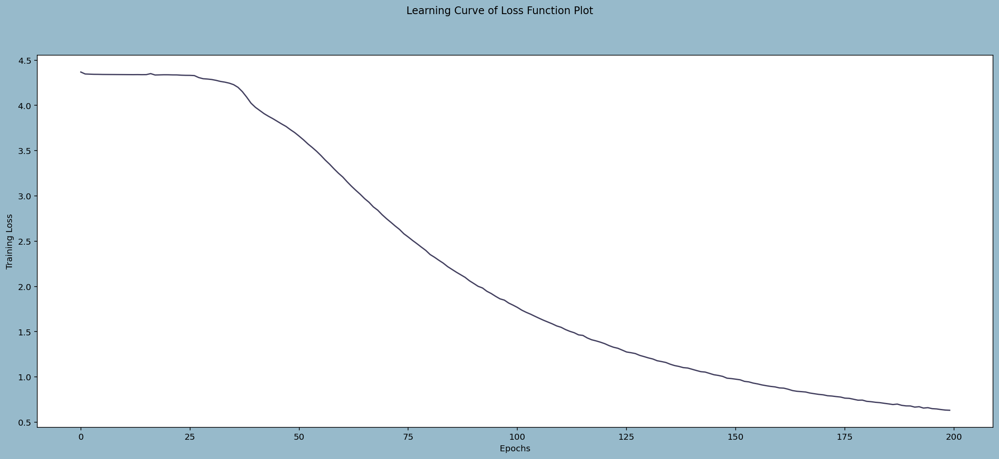

In [24]:
#Plotting the learnings 
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize=(20,8), facecolor="#97BACB")
fig.suptitle("Learning Curve of Loss Function Plot")
pl=sns.lineplot(data=history_df["loss"],color="#444160")
pl.set(ylabel ="Training Loss")
pl.set(xlabel ="Epochs")

The loss function results actually seems pretty solid with the used number of Epochs

**Generating the music**

In [25]:
def Malody_Generator(Note_Count):
    seed = X_seed[np.random.randint(0,len(X_seed)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)   
        Notes_Generated.append(index)
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    #Now, we have music in form or a list of chords and notes and we want to be a midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)   
    return Music,Melody_midi

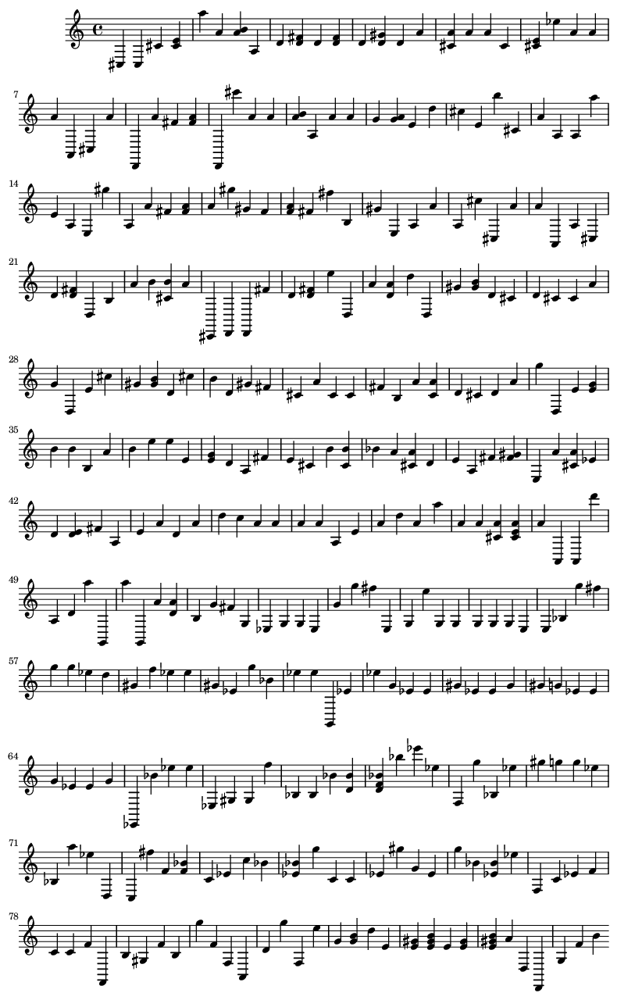

In [34]:
#getting the Notes and Music created by the model
Music_notes, Melody = Malody_Generator(100)
show(Melody)

In [35]:
#To save the generated melody
Melody.write('midi','Melody_Generated_50_omitted_100notes.mid')


'Melody_Generated_50_omitted_300notes.mid'

In [30]:
   #To display the music we first need to convert it into an audio file format hence we are installing fluidsynth and midi2audio packages
   !sudo apt install -y fluidsynth
   !pip install midi2audio
   from midi2audio import FluidSynth
 

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fluidsynth is already the newest version (1.1.9-1).
0 upgraded, 0 newly installed, 0 to remove and 40 not upgraded.


In [36]:
# Additionally the audio file also needs a sound font otherwise the converted audio file won't have any sounds
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
fs = FluidSynth(sound_font='font.sf2')
fs.midi_to_audio('/content/Melody_Generated_50_omitted_100notes.mid', 'Melody_Generated_50_omitted_100notes.mp3')

In [33]:
IPython.display.Audio('/content/Melody_Generated_50_omitted_100notes.mp3')


## Conclusion ##
While the music piece we created with the RNN certainly isn't a masterpiece, stylistically it still approaches the Mozart style (somewhat :)). And it is definitely not too unpleasant to hear. 

## Next steps ##
Given that the LSTM approach can only handle single instrument pieces, it makes a lot of sense to use the magenta models such as Music Vae to try and incorporate more complex music pieces and see how DL models will handle those. It is definitely an interesting topic to pursue further.

